<a href="https://colab.research.google.com/github/savina31/darts/blob/main/CNNKlasifikasiBan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
OptimizerOptions = 'adam'
epochOptions = 50

# Skenario 1

In [4]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [6]:
!mkdir train
!mkdir test

In [7]:
import os

dir_latih = '/content/gdrive/MyDrive/ban/train'
dir_test = '/content/gdrive/MyDrive/ban/test'
dir_latih_target = '/content/train'
dir_test_target = '/content/test'

In [8]:
import cv2
import os
import numpy as np
from shutil import copyfile

# Define the edge detection function
def apply_canny_edge_detection(image_path, target_path):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform edge detection using Canny algorithm
    edges = cv2.Canny(gray, 100, 200)

    # Save the edge detected image to target path
    cv2.imwrite(target_path, edges)

# Define the dataset directory paths
dir_latih = '/content/gdrive/MyDrive/ban/train'
dir_test = '/content/gdrive/MyDrive/ban/test'
dir_latih_target = '/content/train'
dir_test_target = '/content/test'

# Create the target directories if they don't exist
if not os.path.exists(dir_latih_target):
    os.makedirs(dir_latih_target)
if not os.path.exists(dir_test_target):
    os.makedirs(dir_test_target)

# Apply edge detection to the training dataset
for label in os.listdir(dir_latih):
    dir_label = os.path.join(dir_latih, label)
    dir_label_target = os.path.join(dir_latih_target, label)
    if not os.path.exists(dir_label_target):
        os.makedirs(dir_label_target)
    for file_name in os.listdir(dir_label):
        file_path = os.path.join(dir_label, file_name)
        file_path_target = os.path.join(dir_label_target, file_name)
        apply_canny_edge_detection(file_path, file_path_target)

# Apply edge detection to the testing dataset
for label in os.listdir(dir_test):
    dir_label = os.path.join(dir_test, label)
    dir_label_target = os.path.join(dir_test_target, label)
    if not os.path.exists(dir_label_target):
        os.makedirs(dir_label_target)
    for file_name in os.listdir(dir_label):
        file_path = os.path.join(dir_label, file_name)
        file_path_target = os.path.join(dir_label_target, file_name)
        apply_canny_edge_detection(file_path, file_path_target)


In [32]:
# Define learning rate schedule
def lr_schedule(epoch):
    lr = learning_rate
    if epoch > 30:
        lr *= 0.1
    if epoch > 50:
        lr *= 0.1
    return lr

In [33]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import confusion_matrix
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model

In [34]:
# Define hyperparameters
epochs = epochOptions - 20 # not-constant
steps_per_epoch = 5
learning_rate = 0.01
batch_size = 10 # not-constant
validation_steps = 5
train_dir = dir_latih
test_dir = dir_test
optimizer = OptimizerOptions # not-constant

In [ ]:
# Define the model architecture
model = Sequential([
        layers.Reshape((224, 224, 3), input_shape=(224, 224, 3)),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
               layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
               layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
               layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
           layers.Dropout(0.5),
         layers.Dense(256, activation='relu'),
         layers.Dropout(0.5),
         layers.Dense(1, activation='sigmoid')
])
model.summary()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-13-71243717bf6a>", line 2, in <cell line: 2>
    model = Sequential([
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/trackable/base.py", line 205, in _method_wrapper
    result = method(self, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/engine/sequential.py", line 116, in __init__
    super(functional.Functional, self).__init__(name=name, autocast=False)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/trackable/base.py", line 205, in _method_wrapper
    result = method(self, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", lin

TypeError: ignored

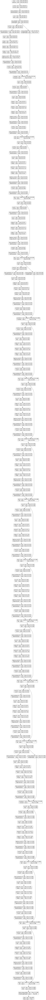

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=True,
                          dpi=55)
model_viz

In [21]:
# Compile the model with categorical cross-entropy loss and Adam optimizer
model.compile(loss='categorical_crossentropy',
                optimizer=optimizer,
                metrics=['accuracy'])

In [22]:
# Define image data generator with augmentation
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

In [23]:
# Load image dataset
train_data = train_datagen.flow_from_directory(
        "/content/train",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

validation_data = test_datagen.flow_from_directory(
        "/content/test",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

Found 480 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [37]:
lr_scheduler = LearningRateScheduler(lr_schedule)
    
# Define callbacks
filepath_best_model = "best_model.h5"
checkpoint_best_model = ModelCheckpoint(filepath_best_model, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
filepath_acc_model = "model_acc_{accuracy:.2f}.h5"
checkpoint_acc_model = ModelCheckpoint(filepath_acc_model, monitor='val_accuracy', verbose=1, save_best_only=False, mode='max')
  
# Train the model
history = model.fit(train_data, epochs=epochs, steps_per_epoch=steps_per_epoch,
                        validation_data=validation_data, validation_steps=validation_steps,
                        batch_size=batch_size,callbacks=[lr_scheduler, checkpoint_best_model, checkpoint_acc_model])

Epoch 1/30
5/5 [==============================] - ETA: 0s - loss: 0.5564 - accuracy: 0.6800
Epoch 1: val_accuracy improved from -inf to 0.78000, saving model to best_model.h5

Epoch 1: saving model to model_acc_0.68.h5
5/5 [==============================] - 6s 1s/step - loss: 0.5564 - accuracy: 0.6800 - val_loss: 0.6446 - val_accuracy: 0.7800 - lr: 0.0100
Epoch 2/30
5/5 [==============================] - ETA: 0s - loss: 0.5665 - accuracy: 0.6400
Epoch 2: val_accuracy did not improve from 0.78000

Epoch 2: saving model to model_acc_0.64.h5
5/5 [==============================] - 5s 1s/step - loss: 0.5665 - accuracy: 0.6400 - val_loss: 0.6423 - val_accuracy: 0.7400 - lr: 0.0100
Epoch 3/30
5/5 [==============================] - ETA: 0s - loss: 0.7160 - accuracy: 0.5800
Epoch 3: val_accuracy did not improve from 0.78000

Epoch 3: saving model to model_acc_0.58.h5
5/5 [==============================] - 4s 946ms/step - loss: 0.7160 - accuracy: 0.5800 - val_loss: 0.6672 - val_accuracy: 0.5600 

In [38]:
# Predict the labels of test data
y_pred = model.predict(validation_data)
y_pred = np.argmax(y_pred, axis=1)

# Convert the true labels
y_true = validation_data.classes

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
TN, FP, FN, TP = conf_matrix.ravel()

# Evaluate the model
test_loss, test_accuracy = model.evaluate(validation_data)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)

12/12 [==============================] - 2s 121ms/step - loss: 0.5700 - accuracy: 0.7583
Test loss: 0.5700477957725525
Test accuracy: 0.7583333253860474


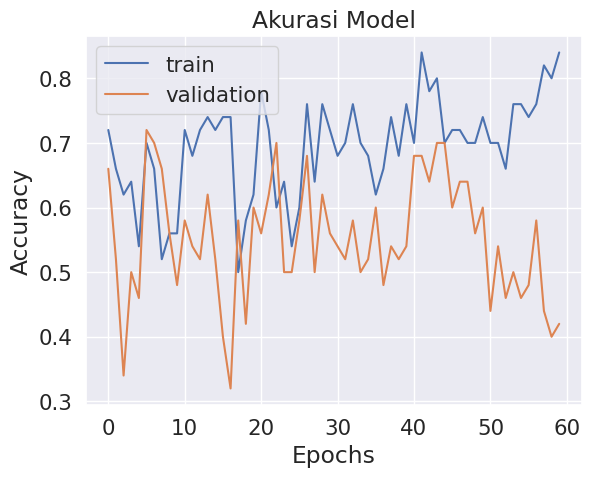

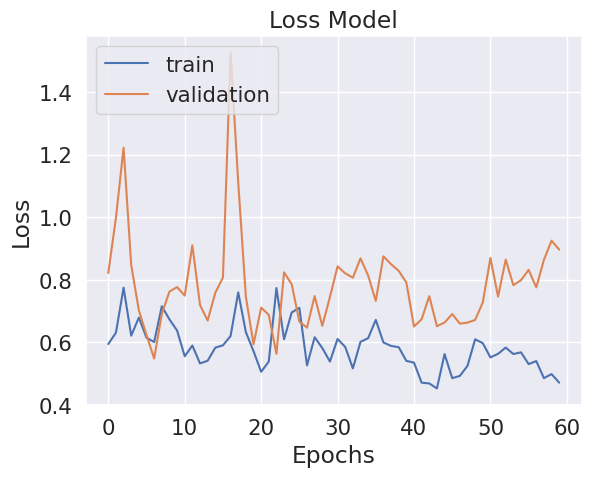

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Akurasi Model')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss Model')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

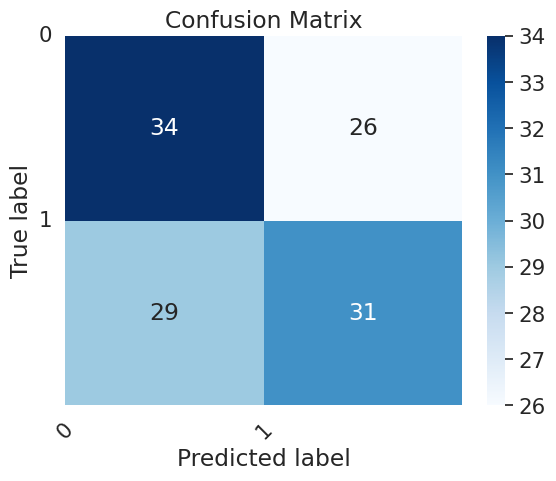

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# define the labels
labels = ['0','1']
categories = ['Zero', 'One']

# create the confusion matrix plot
sns.set(font_scale=1.4)
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=categories, yticklabels=categories)

# set the axis labels and the title
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")

# add the labels for each cell
tick_marks = np.arange(len(labels))

plt.xticks(tick_marks, labels, rotation=45)
plt.yticks(tick_marks, labels, rotation=0)

# show the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report

# calculate the classification report
report = classification_report(y_true, y_pred, target_names=categories)

# print the classification report
print(report)


              precision    recall  f1-score   support

        Zero       0.54      0.57      0.55        60
         One       0.54      0.52      0.53        60

    accuracy                           0.54       120
   macro avg       0.54      0.54      0.54       120
weighted avg       0.54      0.54      0.54       120



In [12]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:
import os
from keras.models import load_model

In [14]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [15]:
# [i for i in os.listdir() if i.endswith("h5")]

model = load_model("ShuffleNet .h5")

In [35]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, concatenate
from tensorflow.keras.models import Model

def shufflenet_block(inputs, num_groups):
    # Inverted Residual block with shuffle operation
    channel_axis = -1
    in_channels = inputs.shape[channel_axis]

    # Grouped Convolution
    bottleneck_channels = in_channels // 4
    x = Conv2D(bottleneck_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(inputs)
    x = tf.nn.relu(x)

    # Depthwise Convolution
    x = tf.keras.layers.DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Pointwise Convolution
    x = Conv2D(in_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Shuffle operation
    x = tf.keras.layers.Reshape((-1, 2, in_channels // 2))(x)
    x = tf.keras.layers.Permute((1, 3, 2))(x)
    x = tf.keras.layers.Reshape((-1, in_channels))(x)
    x = tf.keras.layers.Lambda(lambda x: tf.reshape(x, shape=tf.shape(inputs)))(x)

    # Adjust output shape to match input shape
    residual_channels = in_channels - bottleneck_channels
    res = inputs[:, :, :, :residual_channels]
    x = concatenate([res, x], axis=channel_axis)

    return x


def create_shufflenet(input_shape, num_classes, num_groups=3):
    inputs = Input(shape=input_shape)

    # Initial convolution
    x = Conv2D(24, kernel_size=(3, 3), strides=(2, 2), padding='same')(inputs)
    x = tf.nn.relu(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)

    # ShuffleNet blocks
    x = shufflenet_block(x, num_groups)
    for _ in range(4):  # Add 4 additional blocks (total 5 blocks)
        x = Conv2D(48, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
        x = shufflenet_block(x, num_groups)

    # Additional blocks (15 blocks in total)
    for _ in range(15):
        x = Conv2D(96, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = shufflenet_block(x, num_groups)

    # Additional blocks (30 blocks in total)
    for _ in range(30):
        x = Conv2D(192, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = shufflenet_block(x, num_groups)

    # Final layers
    x = Conv2D(1024, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf


In [36]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 400, 400, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 200, 200, 24  672         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 200, 200, 24  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

# Skenario 2

In [ ]:
# Define learning rate schedule
def lr_schedule(epoch):
    lr = learning_rate
    if epoch > 50:
        lr *= 0.1
    if epoch > 75:
        lr *= 0.1
    return lr

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import confusion_matrix
import numpy as np

NameError: ignored

In [ ]:
# Define the model architecture
model = Sequential([
        layers.Reshape((250, 250, 3), input_shape=(250, 250, 3)),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(1, activation='sigmoid')
])

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=True,
                          dpi=55)
model_viz

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.680307 to fit



In [ ]:
# Compile the model with categorical cross-entropy loss and Adam optimizer
model.compile(loss='categorical_crossentropy',
                optimizer=optimizer,
                metrics=['accuracy'])

In [ ]:
# Define image data generator with augmentation
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Load image dataset
train_data = train_datagen.flow_from_directory(
        "/content/train",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

validation_data = test_datagen.flow_from_directory(
        "/content/test",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

Found 480 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [ ]:
lr_scheduler = LearningRateScheduler(lr_schedule)
    
# Define callbacks
filepath_best_model = "best_model.h5"
checkpoint_best_model = ModelCheckpoint(filepath_best_model, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
filepath_acc_model = "model_acc_{accuracy:.2f}.h5"
checkpoint_acc_model = ModelCheckpoint(filepath_acc_model, monitor='val_accuracy', verbose=1, save_best_only=False, mode='max')
  
# Train the model
history = model.fit(train_data, epochs=epochs, steps_per_epoch=steps_per_epoch,
                        validation_data=validation_data, validation_steps=validation_steps,
                        batch_size=batch_size,callbacks=[lr_scheduler, checkpoint_best_model, checkpoint_acc_model])

RuntimeError: ignored

In [ ]:
# Predict the labels of test data
y_pred = model.predict(validation_data)
y_pred = np.argmax(y_pred, axis=1)

# Convert the true labels
y_true = validation_data.classes

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
TN, FP, FN, TP = conf_matrix.ravel()

# Evaluate the model
test_loss, test_accuracy = model.evaluate(validation_data)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)

12/12 [==============================] - 1s 66ms/step - loss: 0.7746 - accuracy: 0.6000
Test loss: 0.7746347188949585
Test accuracy: 0.6000000238418579


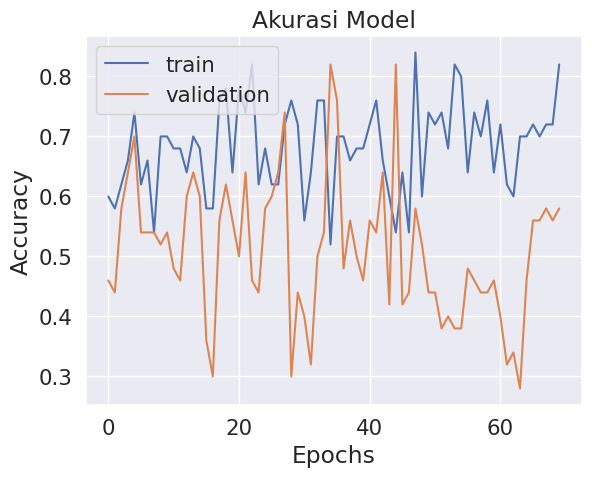

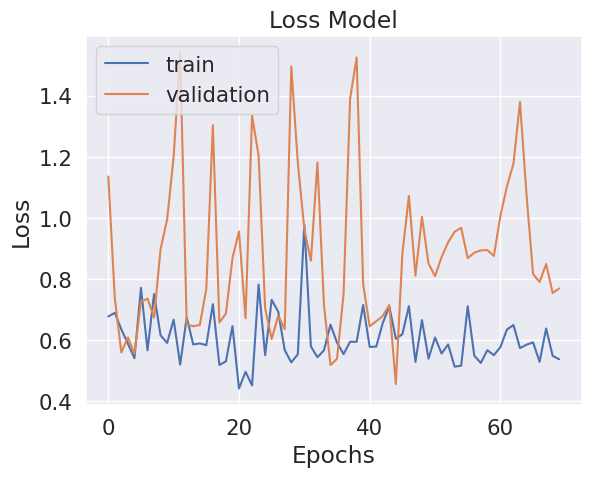

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Akurasi Model')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss Model')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

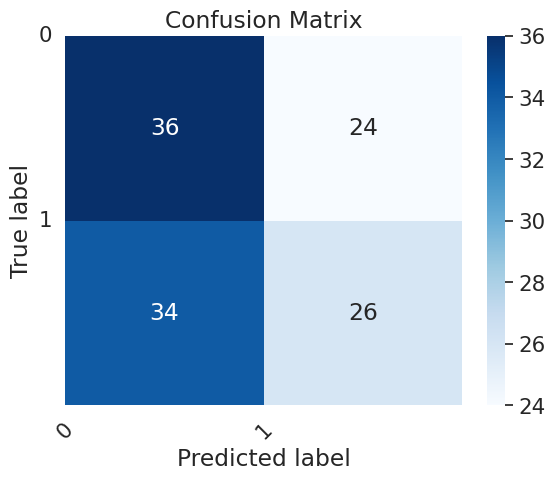

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# define the labels
labels = ['0','1']
categories = ['Zero', 'One']

# create the confusion matrix plot
sns.set(font_scale=1.4)
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=categories, yticklabels=categories)

# set the axis labels and the title
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")

# add the labels for each cell
tick_marks = np.arange(len(labels))

plt.xticks(tick_marks, labels, rotation=45)
plt.yticks(tick_marks, labels, rotation=0)

# show the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report

# calculate the classification report
report = classification_report(y_true, y_pred, target_names=categories)

# print the classification report
print(report)


              precision    recall  f1-score   support

        Zero       0.51      0.60      0.55        60
         One       0.52      0.43      0.47        60

    accuracy                           0.52       120
   macro avg       0.52      0.52      0.51       120
weighted avg       0.52      0.52      0.51       120



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
from keras.models import load_model

In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
# [i for i in os.listdir() if i.endswith("h5")]

model = load_model("ShuffleNet .h5")

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, concatenate
from tensorflow.keras.models import Model

def shufflenet_block(inputs, num_groups):
    # Inverted Residual block with shuffle operation
    channel_axis = -1
    in_channels = inputs.shape[channel_axis]

    # Grouped Convolution
    bottleneck_channels = in_channels // 4
    x = Conv2D(bottleneck_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(inputs)
    x = tf.nn.relu(x)

    # Depthwise Convolution
    x = tf.keras.layers.DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Pointwise Convolution
    x = Conv2D(in_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Shuffle operation
    x = tf.keras.layers.Reshape((-1, 2, in_channels // 2))(x)
    x = tf.keras.layers.Permute((1, 3, 2))(x)
    x = tf.keras.layers.Reshape((-1, in_channels))(x)
    x = tf.keras.layers.Lambda(lambda x: tf.reshape(x, shape=tf.shape(inputs)))(x)

    # Adjust output shape to match input shape
    residual_channels = in_channels - bottleneck_channels
    res = inputs[:, :, :, :residual_channels]
    x = concatenate([res, x], axis=channel_axis)

    return x


def create_shufflenet(input_shape, num_classes, num_groups=3):
    inputs = Input(shape=input_shape)

    # Initial convolution
    x = Conv2D(24, kernel_size=(3, 3), strides=(2, 2), padding='same')(inputs)
    x = tf.nn.relu(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)

    # ShuffleNet blocks
    x = shufflenet_block(x, num_groups)
    for _ in range(4):  # Add 4 additional blocks (total 5 blocks)
        x = Conv2D(48, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
        x = shufflenet_block(x, num_groups)

    # Additional blocks (15 blocks in total)
    for _ in range(15):
        x = Conv2D(96, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = shufflenet_block(x, num_groups)

    # Additional blocks (30 blocks in total)
    for _ in range(30):
        x = Conv2D(192, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = shufflenet_block(x, num_groups)

    # Additional blocks (10 blocks in total)
    for _ in range(10):
        x = Conv2D(384, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = shufflenet_block(x, num_groups)

    # Final layers
    x = Conv2D(1024, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)

    # Create model
    model = Model(inputs=inputs, outputs=x)

    return model

# Example usage of the model
input_shape = (224, 224, 3)
num_classes = 2
model = create_shufflenet(input_shape, num_classes, num_groups=3)
model.summary()


TypeError: ignored

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 400, 400, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 200, 200, 24  672         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 200, 200, 24  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

# Skenario 3

In [ ]:
# Define learning rate schedule
def lr_schedule(epoch):
    lr = learning_rate
    if epoch > 50:
        lr *= 0.1
    if epoch > 75:
        lr *= 0.1
    return lr

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import confusion_matrix
import numpy as np

In [ ]:
# Define hyperparameters
epochs = epochOptions + 40 # not-constant
steps_per_epoch = 5
learning_rate = 0.01
batch_size = 10 # not-constant
validation_steps = 5
train_dir = dir_latih
test_dir = dir_test
optimizer = OptimizerOptions # not-constant

In [ ]:
# Define the model architecture
model = Sequential([
        layers.Reshape((250, 250, 3), input_shape=(250, 250, 3)),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(1, activation='sigmoid')
])

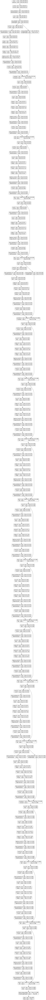

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=True,
                          dpi=55)
model_viz

In [ ]:
# Compile the model with categorical cross-entropy loss and Adam optimizer
model.compile(loss='categorical_crossentropy',
                optimizer=optimizer,
                metrics=['accuracy'])

In [ ]:
# Define image data generator with augmentation
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Load image dataset
train_data = train_datagen.flow_from_directory(
        "/content/train",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

validation_data = test_datagen.flow_from_directory(
        "/content/test",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

Found 480 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [ ]:
lr_scheduler = LearningRateScheduler(lr_schedule)
    
# Define callbacks
filepath_best_model = "best_model.h5"
checkpoint_best_model = ModelCheckpoint(filepath_best_model, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
filepath_acc_model = "model_acc_{accuracy:.2f}.h5"
checkpoint_acc_model = ModelCheckpoint(filepath_acc_model, monitor='val_accuracy', verbose=1, save_best_only=False, mode='max')
  
# Train the model
history = model.fit(train_data, epochs=epochs, steps_per_epoch=steps_per_epoch,
                        validation_data=validation_data, validation_steps=validation_steps,
                        batch_size=batch_size,callbacks=[lr_scheduler, checkpoint_best_model, checkpoint_acc_model])

Epoch 1/90
5/5 [==============================] - ETA: 0s - loss: 9.8472 - accuracy: 0.5800
Epoch 1: val_accuracy improved from -inf to 0.58000, saving model to best_model.h5

Epoch 1: saving model to model_acc_0.58.h5
5/5 [==============================] - 50s 2s/step - loss: 9.8472 - accuracy: 0.5800 - val_loss: 0.6894 - val_accuracy: 0.5800 - lr: 0.0100
Epoch 2/90
5/5 [==============================] - ETA: 0s - loss: 5.7505 - accuracy: 0.5400
Epoch 2: val_accuracy did not improve from 0.58000

Epoch 2: saving model to model_acc_0.54.h5
5/5 [==============================] - 7s 1s/step - loss: 5.7505 - accuracy: 0.5400 - val_loss: 0.7342 - val_accuracy: 0.4200 - lr: 0.0100
Epoch 3/90
5/5 [==============================] - ETA: 0s - loss: 1.2032 - accuracy: 0.5000
Epoch 3: val_accuracy did not improve from 0.58000

Epoch 3: saving model to model_acc_0.50.h5
5/5 [==============================] - 5s 1s/step - loss: 1.2032 - accuracy: 0.5000 - val_loss: 0.6951 - val_accuracy: 0.5000 - 

In [ ]:
# Predict the labels of test data
y_pred = model.predict(validation_data)
y_pred = np.argmax(y_pred, axis=1)

# Convert the true labels
y_true = validation_data.classes

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
TN, FP, FN, TP = conf_matrix.ravel()

# Evaluate the model
test_loss, test_accuracy = model.evaluate(validation_data)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)

12/12 [==============================] - 1s 69ms/step - loss: 0.7574 - accuracy: 0.4667
Test loss: 0.7573748826980591
Test accuracy: 0.46666666865348816


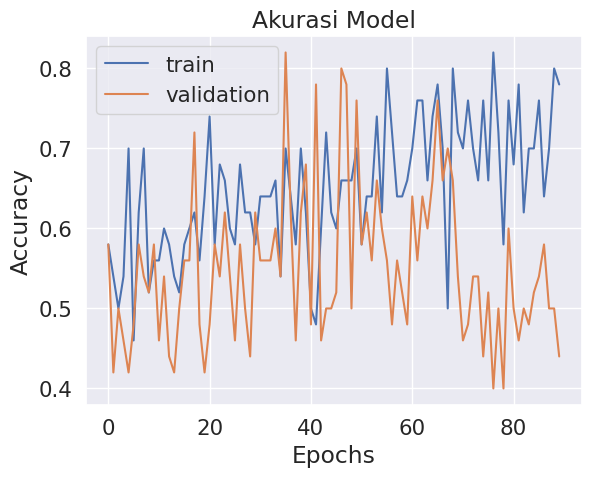

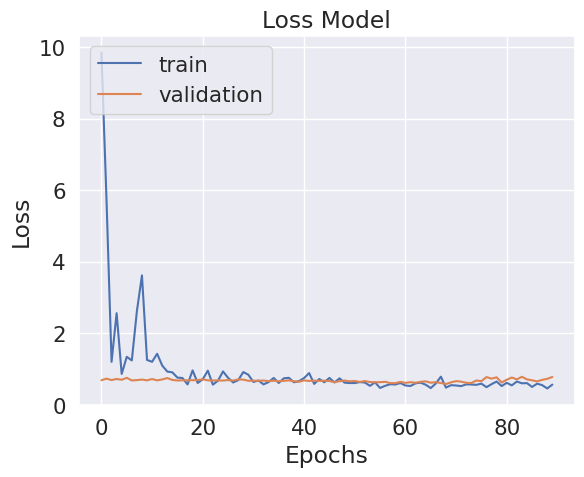

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Akurasi Model')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss Model')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

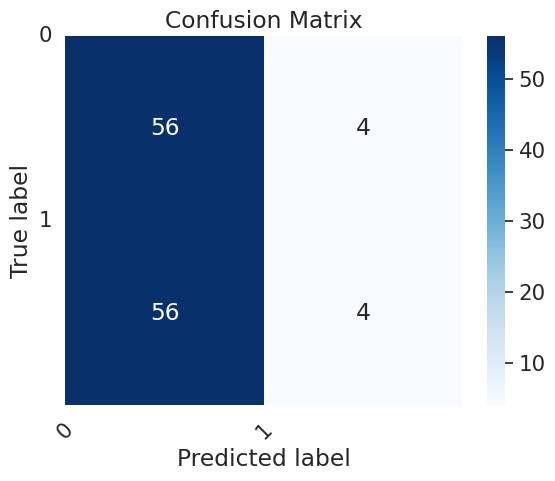

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# define the labels
labels = ['0','1']
categories = ['Zero', 'One']

# create the confusion matrix plot
sns.set(font_scale=1.4)
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=categories, yticklabels=categories)

# set the axis labels and the title
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")

# add the labels for each cell
tick_marks = np.arange(len(labels))

plt.xticks(tick_marks, labels, rotation=45)
plt.yticks(tick_marks, labels, rotation=0)

# show the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report

# calculate the classification report
report = classification_report(y_true, y_pred, target_names=categories)

# print the classification report
print(report)


              precision    recall  f1-score   support

        Zero       0.50      0.93      0.65        60
         One       0.50      0.07      0.12        60

    accuracy                           0.50       120
   macro avg       0.50      0.50      0.38       120
weighted avg       0.50      0.50      0.38       120



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
from keras.models import load_model

In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
# [i for i in os.listdir() if i.endswith("h5")]

model = load_model("ShuffleNet .h5")

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, concatenate
from tensorflow.keras.models import Model

def shufflenet_block(inputs, num_groups):
    # Inverted Residual block with shuffle operation
    channel_axis = -1
    in_channels = inputs.shape[channel_axis]

    # Grouped Convolution
    bottleneck_channels = in_channels // 4
    x = Conv2D(bottleneck_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(inputs)
    x = tf.nn.relu(x)

    # Depthwise Convolution
    x = tf.keras.layers.DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Pointwise Convolution
    x = Conv2D(in_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Shuffle operation
    x = tf.keras.layers.Reshape((-1, 2, in_channels // 2))(x)
    x = tf.keras.layers.Permute((1, 3, 2))(x)
    x = tf.keras.layers.Reshape((-1, in_channels))(x)
    x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(x)

    # Adjust output shape to match input shape
    residual_channels = in_channels - bottleneck_channels
    res = inputs[:, :, :, :residual_channels]
    x = concatenate([res, x], axis=channel_axis)

    return x


def create_shufflenet(input_shape, num_classes, num_groups=3):
    inputs = Input(shape=input_shape)

    # Initial convolution
    x = Conv2D(24, kernel_size=(3, 3), strides=(2, 2), padding='same')(inputs)
    x = tf.nn.relu(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)

    # ShuffleNet blocks
    x = shufflenet_block(x, num_groups)
    for _ in range(3):  # Add 3 additional conv and max pooling layers
        x = Conv2D(48, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
        x = shufflenet_block(x, num_groups)

    # Final layers
    x = Conv2D(1024, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)

    # Create model
    model = Model(inputs=inputs, outputs=x)

    return model

# Contoh pengguna


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 400, 400, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 200, 200, 24  672         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 200, 200, 24  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

# Skenario 4

In [ ]:
# Define learning rate schedule
def lr_schedule(epoch):
    lr = learning_rate
    if epoch > 50:
        lr *= 0.1
    if epoch > 75:
        lr *= 0.1
    return lr

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import confusion_matrix
import numpy as np

In [ ]:
# Define hyperparameters
epochs = epochOptions + 50 # not-constant
steps_per_epoch = 5
learning_rate = 0.01
batch_size = 10 # not-constant
validation_steps = 5
train_dir = dir_latih
test_dir = dir_test
optimizer = OptimizerOptions # not-constant

In [ ]:
# Define the model architecture
model = Sequential([
        layers.Reshape((250, 250, 3), input_shape=(250, 250, 3)),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(1, activation='sigmoid')
])

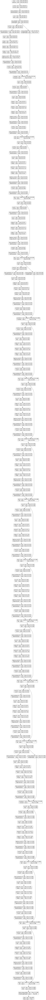

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=True,
                          dpi=55)
model_viz

In [ ]:
# Compile the model with categorical cross-entropy loss and Adam optimizer
model.compile(loss='categorical_crossentropy',
                optimizer=optimizer,
                metrics=['accuracy'])

In [ ]:
# Define image data generator with augmentation
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Load image dataset
train_data = train_datagen.flow_from_directory(
        "/content/train",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

validation_data = test_datagen.flow_from_directory(
        "/content/test",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

Found 480 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [ ]:
lr_scheduler = LearningRateScheduler(lr_schedule)
    
# Define callbacks
filepath_best_model = "best_model.h5"
checkpoint_best_model = ModelCheckpoint(filepath_best_model, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
filepath_acc_model = "model_acc_{accuracy:.2f}.h5"
checkpoint_acc_model = ModelCheckpoint(filepath_acc_model, monitor='val_accuracy', verbose=1, save_best_only=False, mode='max')
  
# Train the model
history = model.fit(train_data, epochs=epochs, steps_per_epoch=steps_per_epoch,
                        validation_data=validation_data, validation_steps=validation_steps,
                        batch_size=batch_size,callbacks=[lr_scheduler, checkpoint_best_model, checkpoint_acc_model])

Epoch 1/100
5/5 [==============================] - ETA: 0s - loss: 12.8346 - accuracy: 0.4400
Epoch 1: val_accuracy improved from -inf to 0.62000, saving model to best_model.h5

Epoch 1: saving model to model_acc_0.44.h5
5/5 [==============================] - 52s 3s/step - loss: 12.8346 - accuracy: 0.4400 - val_loss: 0.6677 - val_accuracy: 0.6200 - lr: 0.0100
Epoch 2/100
5/5 [==============================] - ETA: 0s - loss: 8.2805 - accuracy: 0.4000
Epoch 2: val_accuracy did not improve from 0.62000

Epoch 2: saving model to model_acc_0.40.h5
5/5 [==============================] - 5s 1s/step - loss: 8.2805 - accuracy: 0.4000 - val_loss: 0.6915 - val_accuracy: 0.5200 - lr: 0.0100
Epoch 3/100
5/5 [==============================] - ETA: 0s - loss: 3.8287 - accuracy: 0.5000
Epoch 3: val_accuracy did not improve from 0.62000

Epoch 3: saving model to model_acc_0.50.h5
5/5 [==============================] - 5s 987ms/step - loss: 3.8287 - accuracy: 0.5000 - val_loss: 0.7067 - val_accuracy: 0

In [ ]:
# Predict the labels of test data
y_pred = model.predict(validation_data)
y_pred = np.argmax(y_pred, axis=1)

# Convert the true labels
y_true = validation_data.classes

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
TN, FP, FN, TP = conf_matrix.ravel()

# Evaluate the model
test_loss, test_accuracy = model.evaluate(validation_data)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)

12/12 [==============================] - 2s 138ms/step - loss: 0.6029 - accuracy: 0.6750
Test loss: 0.6028849482536316
Test accuracy: 0.675000011920929


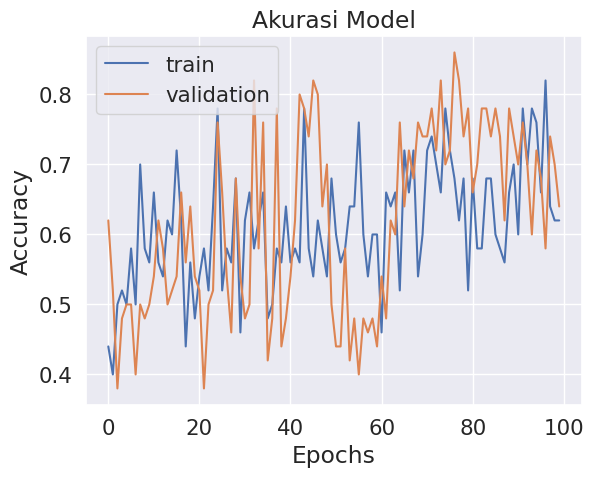

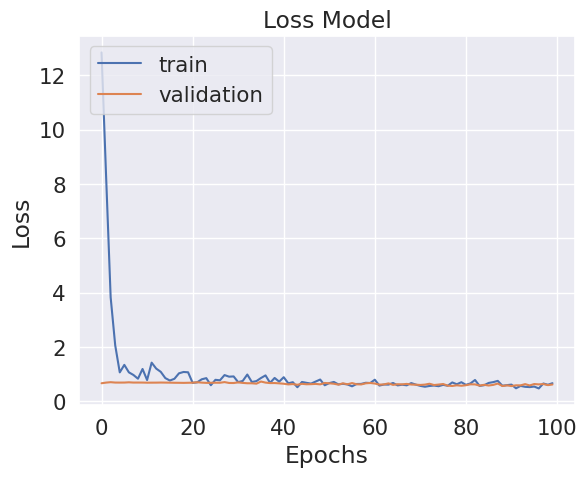

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Akurasi Model')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss Model')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

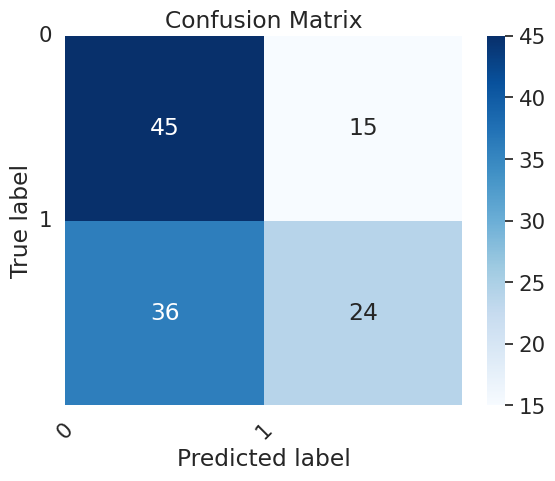

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# define the labels
labels = ['0','1']
categories = ['Zero', 'One']

# create the confusion matrix plot
sns.set(font_scale=1.4)
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=categories, yticklabels=categories)

# set the axis labels and the title
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")

# add the labels for each cell
tick_marks = np.arange(len(labels))

plt.xticks(tick_marks, labels, rotation=45)
plt.yticks(tick_marks, labels, rotation=0)

# show the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report

# calculate the classification report
report = classification_report(y_true, y_pred, target_names=categories)

# print the classification report
print(report)


              precision    recall  f1-score   support

        Zero       0.56      0.75      0.64        60
         One       0.62      0.40      0.48        60

    accuracy                           0.57       120
   macro avg       0.59      0.57      0.56       120
weighted avg       0.59      0.57      0.56       120



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
from keras.models import load_model

In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
# [i for i in os.listdir() if i.endswith("h5")]

model = load_model("ShuffleNet .h5")

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, concatenate
from tensorflow.keras.models import Model

def shufflenet_block(inputs, num_groups):
    # Inverted Residual block with shuffle operation
    channel_axis = -1
    in_channels = inputs.shape[channel_axis]

    # Grouped Convolution
    bottleneck_channels = in_channels // 4
    x = Conv2D(bottleneck_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(inputs)
    x = tf.nn.relu(x)

    # Depthwise Convolution
    x = tf.keras.layers.DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Pointwise Convolution
    x = Conv2D(in_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Shuffle operation
    x = tf.keras.layers.Reshape((-1, 2, in_channels // 2))(x)
    x = tf.keras.layers.Permute((1, 3, 2))(x)
    x = tf.keras.layers.Reshape((-1, in_channels))(x)
    x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(x)

    # Adjust output shape to match input shape
    residual_channels = in_channels - bottleneck_channels
    res = inputs[:, :, :, :residual_channels]
    x = concatenate([res, x], axis=channel_axis)

    return x


def create_shufflenet(input_shape, num_classes, num_groups=3):
    inputs = Input(shape=input_shape)

    # Initial convolution
    x = Conv2D(24, kernel_size=(3, 3), strides=(2, 2), padding='same')(inputs)
    x = tf.nn.relu(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)

    # ShuffleNet blocks
    x = shufflenet_block(x, num_groups)
    for _ in range(3):  # Add 3 additional conv and max pooling layers
        x = Conv2D(48, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
        x = shufflenet_block(x, num_groups)

    # Final layers
    x = Conv2D(1024, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)

    # Create model
    model = Model(inputs=inputs, outputs=x)

    return model

# Contoh pengguna


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 400, 400, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 200, 200, 24  672         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 200, 200, 24  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

# Skenario 5

In [ ]:
# Define learning rate schedule
def lr_schedule(epoch):
    lr = learning_rate
    if epoch > 50:
        lr *= 0.1
    if epoch > 75:
        lr *= 0.1
    return lr

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import confusion_matrix
import numpy as np

In [ ]:
# Define hyperparameters
epochs = epochOptions + 100 # not-constant
steps_per_epoch = 5
learning_rate = 0.01
batch_size = 10 # not-constant
validation_steps = 5
train_dir = dir_latih
test_dir = dir_test
optimizer = OptimizerOptions # not-constant

In [ ]:
# Define the model architecture
model = Sequential([
        layers.Reshape((250, 250, 3), input_shape=(250, 250, 3)),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(1, activation='sigmoid')
])

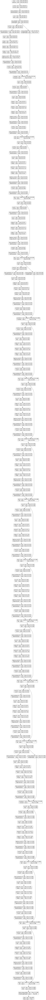

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=True,
                          dpi=55)
model_viz

In [ ]:
# Compile the model with categorical cross-entropy loss and Adam optimizer
model.compile(loss='categorical_crossentropy',
                optimizer=optimizer,
                metrics=['accuracy'])

In [ ]:
# Define image data generator with augmentation
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Load image dataset
train_data = train_datagen.flow_from_directory(
        "/content/train",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

validation_data = test_datagen.flow_from_directory(
        "/content/test",
        target_size=(400, 400),
        batch_size=batch_size,
        class_mode='categorical')

Found 480 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [ ]:
lr_scheduler = LearningRateScheduler(lr_schedule)
    
# Define callbacks
filepath_best_model = "best_model.h5"
checkpoint_best_model = ModelCheckpoint(filepath_best_model, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
filepath_acc_model = "model_acc_{accuracy:.2f}.h5"
checkpoint_acc_model = ModelCheckpoint(filepath_acc_model, monitor='val_accuracy', verbose=1, save_best_only=False, mode='max')
  
# Train the model
history = model.fit(train_data, epochs=epochs, steps_per_epoch=steps_per_epoch,
                        validation_data=validation_data, validation_steps=validation_steps,
                        batch_size=batch_size,callbacks=[lr_scheduler, checkpoint_best_model, checkpoint_acc_model])

Epoch 1/150
5/5 [==============================] - ETA: 0s - loss: 6.4385 - accuracy: 0.6200
Epoch 1: val_accuracy improved from -inf to 0.54000, saving model to best_model.h5

Epoch 1: saving model to model_acc_0.62.h5
5/5 [==============================] - 53s 3s/step - loss: 6.4385 - accuracy: 0.6200 - val_loss: 0.6476 - val_accuracy: 0.5400 - lr: 0.0100
Epoch 2/150
5/5 [==============================] - ETA: 0s - loss: 5.7580 - accuracy: 0.6400
Epoch 2: val_accuracy did not improve from 0.54000

Epoch 2: saving model to model_acc_0.64.h5
5/5 [==============================] - 5s 1s/step - loss: 5.7580 - accuracy: 0.6400 - val_loss: 0.8173 - val_accuracy: 0.5200 - lr: 0.0100
Epoch 3/150
5/5 [==============================] - ETA: 0s - loss: 4.0647 - accuracy: 0.6200
Epoch 3: val_accuracy improved from 0.54000 to 0.58000, saving model to best_model.h5

Epoch 3: saving model to model_acc_0.62.h5
5/5 [==============================] - 7s 1s/step - loss: 4.0647 - accuracy: 0.6200 - val_

In [ ]:
# Predict the labels of test data
y_pred = model.predict(validation_data)
y_pred = np.argmax(y_pred, axis=1)

# Convert the true labels
y_true = validation_data.classes

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
TN, FP, FN, TP = conf_matrix.ravel()

# Evaluate the model
test_loss, test_accuracy = model.evaluate(validation_data)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)

12/12 [==============================] - 2s 114ms/step - loss: 3.9367 - accuracy: 0.3917
Test loss: 3.9367270469665527
Test accuracy: 0.3916666805744171


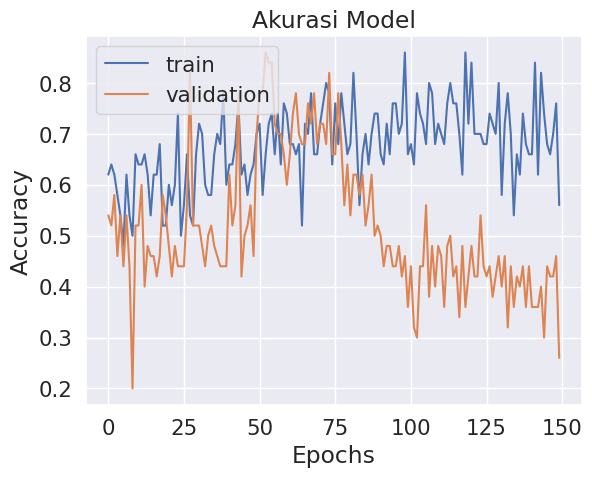

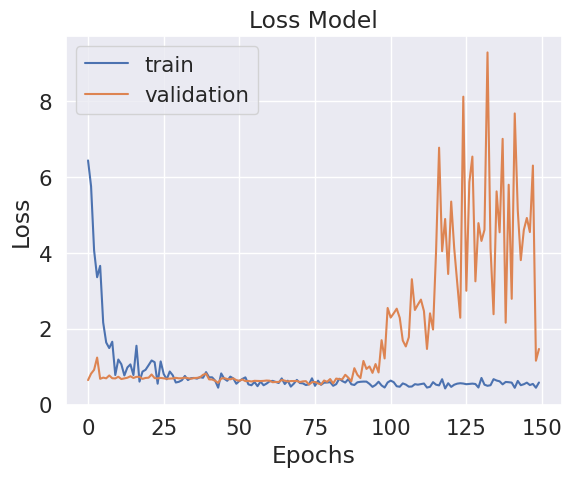

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Akurasi Model')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss Model')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

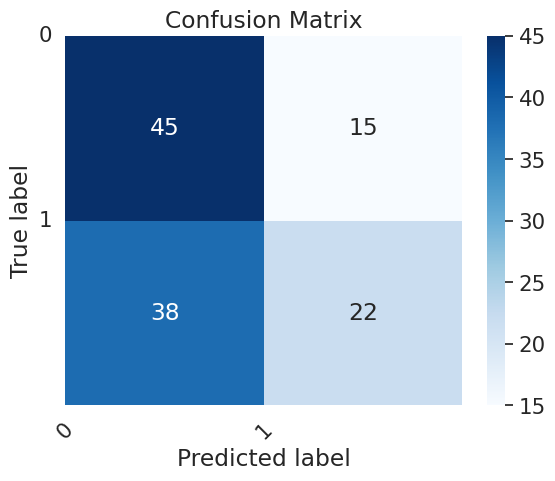

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# define the labels
labels = ['0','1']
categories = ['Zero', 'One']

# create the confusion matrix plot
sns.set(font_scale=1.4)
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=categories, yticklabels=categories)

# set the axis labels and the title
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")

# add the labels for each cell
tick_marks = np.arange(len(labels))

plt.xticks(tick_marks, labels, rotation=45)
plt.yticks(tick_marks, labels, rotation=0)

# show the plot
plt.show()

In [ ]:
from sklearn.metrics import classification_report

# calculate the classification report
report = classification_report(y_true, y_pred, target_names=categories)

# print the classification report
print(report)


              precision    recall  f1-score   support

        Zero       0.54      0.75      0.63        60
         One       0.59      0.37      0.45        60

    accuracy                           0.56       120
   macro avg       0.57      0.56      0.54       120
weighted avg       0.57      0.56      0.54       120



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
from keras.models import load_model

In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
# [i for i in os.listdir() if i.endswith("h5")]

model = load_model("ShuffleNet .h5")

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, concatenate
from tensorflow.keras.models import Model

def shufflenet_block(inputs, num_groups):
    # Inverted Residual block with shuffle operation
    channel_axis = -1
    in_channels = inputs.shape[channel_axis]

    # Grouped Convolution
    bottleneck_channels = in_channels // 4
    x = Conv2D(bottleneck_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(inputs)
    x = tf.nn.relu(x)

    # Depthwise Convolution
    x = tf.keras.layers.DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Pointwise Convolution
    x = Conv2D(in_channels, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)

    # Shuffle operation
    x = tf.keras.layers.Reshape((-1, 2, in_channels // 2))(x)
    x = tf.keras.layers.Permute((1, 3, 2))(x)
    x = tf.keras.layers.Reshape((-1, in_channels))(x)
    x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(x)

    # Adjust output shape to match input shape
    residual_channels = in_channels - bottleneck_channels
    res = inputs[:, :, :, :residual_channels]
    x = concatenate([res, x], axis=channel_axis)

    return x


def create_shufflenet(input_shape, num_classes, num_groups=3):
    inputs = Input(shape=input_shape)

    # Initial convolution
    x = Conv2D(24, kernel_size=(3, 3), strides=(2, 2), padding='same')(inputs)
    x = tf.nn.relu(x)
    x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)

    # ShuffleNet blocks
    x = shufflenet_block(x, num_groups)
    for _ in range(3):  # Add 3 additional conv and max pooling layers
        x = Conv2D(48, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
        x = tf.nn.relu(x)
        x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
        x = shufflenet_block(x, num_groups)

    # Final layers
    x = Conv2D(1024, kernel_size=(1, 1), strides=(1, 1), padding='same')(x)
    x = tf.nn.relu(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = Dense(num_classes, activation='softmax')(x)

    # Create model
    model = Model(inputs=inputs, outputs=x)

    return model

# Contoh pengguna


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 400, 400, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 200, 200, 24  672         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 200, 200, 24  96         ['conv2d[0][0]']                 
 alization)                     )                                                             